In [1]:
import h5py

In [2]:
f = h5py.File('/home/lukasb/projects/rpp-tanaka-ab/lukasb/watchmal/20190808-uniisoflat/1Rmu-blacksheet/wc-0-bch1.h5','r')
event_data = f['event_data'][:]

In [3]:
from __future__ import print_function
import numpy as np

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
import torch 

def geometricPad(grid, pad=1):
  M = grid.shape[2]; # 0:batchsize, 1:channels, 2:width, 3:height
  M_new = pad+M+pad;
  new_shape = (grid.shape[0], grid.shape[1], M_new, M_new)
  grid_new = grid.new_zeros(new_shape);
  grid_new[:,:,pad:M+pad,pad:M+pad] = grid;
  grid_new[:,:,0:pad,pad:(M+pad)] = grid[:,:,:,0:pad].flip(-1).transpose(-1,-2);
  grid_new[:,:,pad:(M+pad),0:pad] = grid[:,:,0:pad,:].flip(-2).transpose(-1,-2);
  grid_new[:,:,(M+pad):(M+pad+pad),(pad):(M+pad)] = grid[:,:,:,(M-pad):].flip(-1).transpose(-1,-2);
  grid_new[:,:,pad:(M+pad),(M+pad):(M+pad+pad)] = grid[:,:,(M-pad):,:].flip(-2).transpose(-1,-2);
  return(grid_new);

compute AA tensor for Taylor CNN

In [6]:
# M: number of cols or rows grid

pad = 2

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()],
  f['mGridY'][()],
  f['mGridZ'][()],
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 1.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 25)
X.shape: (7, 105, 105, 25)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 25)


In [7]:
print('dis', dis)
print('djs', djs)
print(12, '(', dis[12], ',', djs[12], ')')
print(13, '(', dis[13], ',', djs[13], ')')

dis [-2 -2 -2 -2 -2 -1 -1 -1 -1 -1  0  0  0  0  0  1  1  1  1  1  2  2  2  2
  2]
djs [-2 -1  0  1  2 -2 -1  0  1  2 -2 -1  0  1  2 -2 -1  0  1  2 -2 -1  0  1
  2]
12 ( 0 , 0 )
13 ( 0 , 1 )


x, noshift


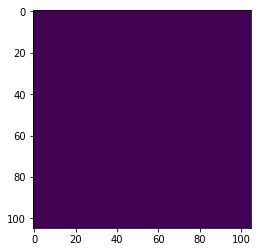

y, noshift


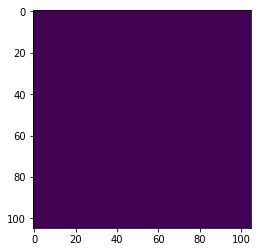

In [8]:
print('x, noshift')
site=12
plt.imshow(x[0,:,:,site])
plt.show()

print('y, noshift')
site=12
plt.imshow(x[1,:,:,site])
plt.show()

(di,dj)=(0,1)


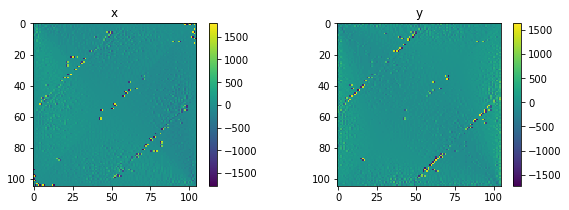

In [9]:
site=13
print('(di,dj)=(%d,%d)' % (dis[site],djs[site]))

fig, (ax0,ax1) = plt.subplots(1, 2, figsize=(10,3),facecolor='w')
im = ax0.imshow(x[0,:,:,site]); ax0.set_title('x');
cbar = ax0.figure.colorbar(im, ax=ax0)
im = ax1.imshow(x[1,:,:,site]); ax1.set_title('y')
cbar = ax1.figure.colorbar(im, ax=ax1)
plt.show()

(di,dj)=(0,2)


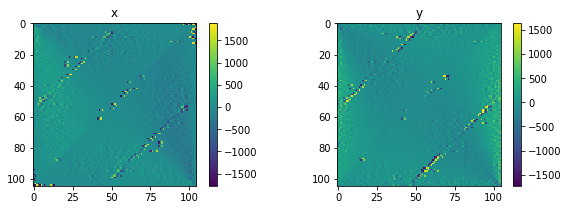

In [10]:
site=14
print('(di,dj)=(%d,%d)' % (dis[site],djs[site]))

fig, (ax0,ax1) = plt.subplots(1, 2, figsize=(10,3),facecolor='w')
im = ax0.imshow(x[0,:,:,site]); ax0.set_title('x');
cbar = ax0.figure.colorbar(im, ax=ax0)
im = ax1.imshow(x[1,:,:,site]); ax1.set_title('y')
cbar = ax1.figure.colorbar(im, ax=ax1)
plt.show()

(di,dj)=(0,1) this time X not x


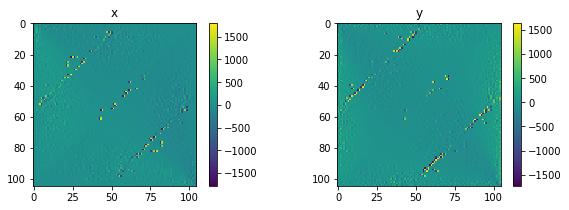

In [11]:
site=13
print('(di,dj)=(%d,%d) this time X not x' % (dis[site],djs[site]))

fig, (ax0,ax1) = plt.subplots(1, 2, figsize=(10,3),facecolor='w')
im = ax0.imshow(X[1+0,:,:,site]); ax0.set_title('x');
cbar = ax0.figure.colorbar(im, ax=ax0)
im = ax1.imshow(X[1+1,:,:,site]); ax1.set_title('y')
cbar = ax1.figure.colorbar(im, ax=ax1)
plt.show()

tGridAA.shape: torch.Size([7, 105, 105, 25])
tayloredInput.shape: torch.Size([5, 7, 1, 105, 105])
inputsPad.shape: torch.Size([5, 1, 109, 109])


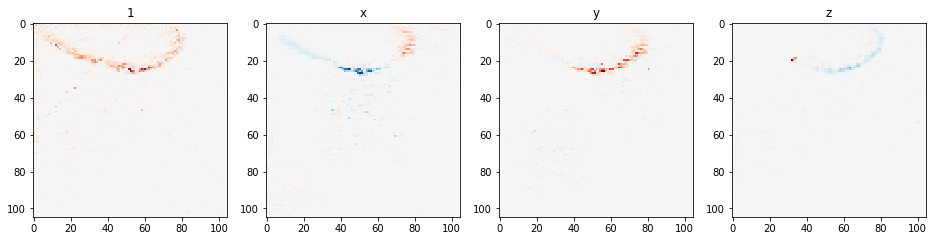

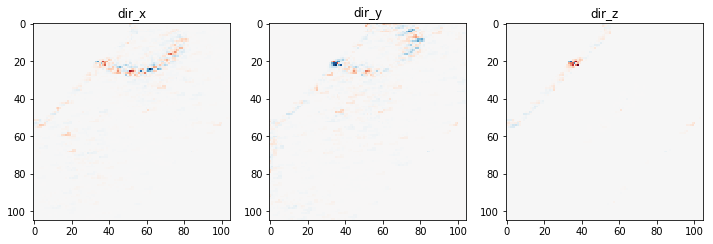

In [12]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:5,:,:,0]).unsqueeze(1);
# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)


ev=0
fig, (ax0,ax1,ax2,ax3) = plt.subplots(1, 4, figsize=(16,8),facecolor='w')
imshowRdBu(ax0, tayloredInput[ev,0,:,:]); ax0.set_title('1')
imshowRdBu(ax1, tayloredInput[ev,1,:,:]); ax1.set_title('x')
imshowRdBu(ax2, tayloredInput[ev,2,:,:]); ax2.set_title('y')
imshowRdBu(ax3, tayloredInput[ev,3,:,:]); ax3.set_title('z')
plt.show()

fig, (ax0,ax1,ax2) = plt.subplots(1, 3, figsize=(12,8),facecolor='w')
imshowRdBu(ax0, tayloredInput[ev,4,:,:]); ax0.set_title('dir_x')
imshowRdBu(ax1, tayloredInput[ev,5,:,:]); ax1.set_title('dir_y')
imshowRdBu(ax2, tayloredInput[ev,6,:,:]); ax2.set_title('dir_z')
plt.show()

tGridAA.shape: torch.Size([7, 105, 105, 25])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 109, 109])
mGridX


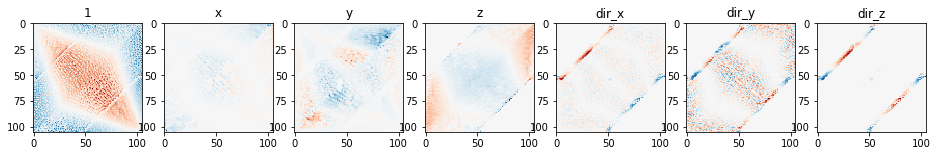

mGridY


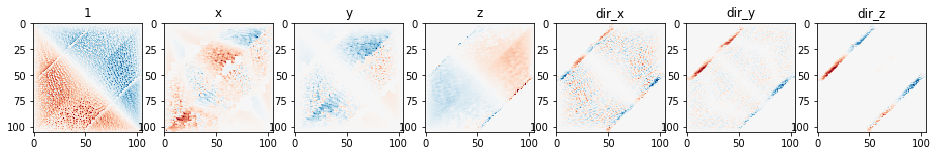

mGridZ


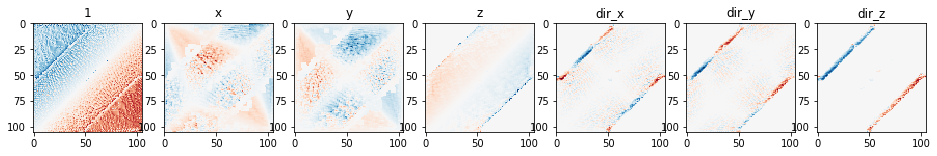

mGridDirX


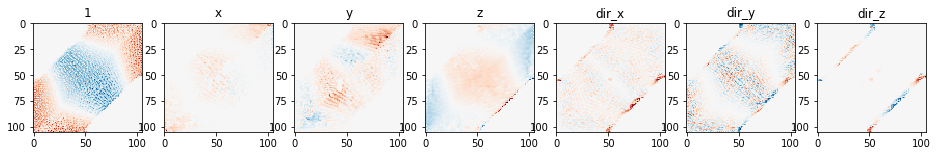

mGridDirY


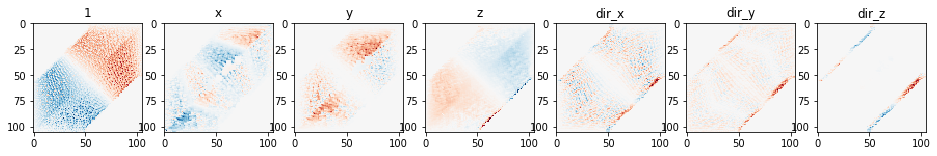

mGridDirZ


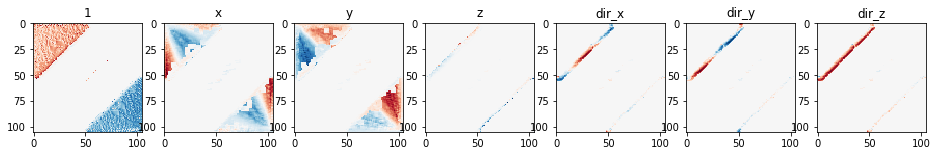

In [13]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:6,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = torch.tensor(f['mGrid%s' % evMeanings[ev]][()])

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    fig, (ax0,ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1, 7, figsize=(16,8),facecolor='w')
    imshowRdBu(ax0, tayloredInput[ev,0,:,:]); ax0.set_title('1')
    imshowRdBu(ax1, tayloredInput[ev,1,:,:]); ax1.set_title('x')
    imshowRdBu(ax2, tayloredInput[ev,2,:,:]); ax2.set_title('y')
    imshowRdBu(ax3, tayloredInput[ev,3,:,:]); ax3.set_title('z')
    imshowRdBu(ax4, tayloredInput[ev,4,:,:]); ax4.set_title('dir_x')
    imshowRdBu(ax5, tayloredInput[ev,5,:,:]); ax5.set_title('dir_y')
    imshowRdBu(ax6, tayloredInput[ev,6,:,:]); ax6.set_title('dir_z')
    plt.show()

tGridAA.shape: torch.Size([7, 105, 105, 25])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 109, 109])
mGridX


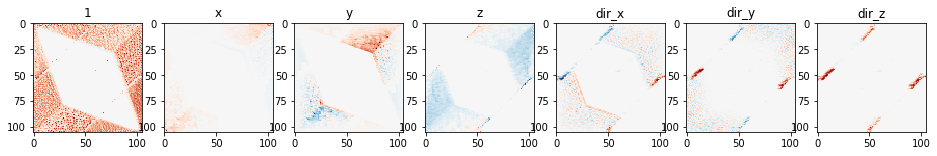

mGridY


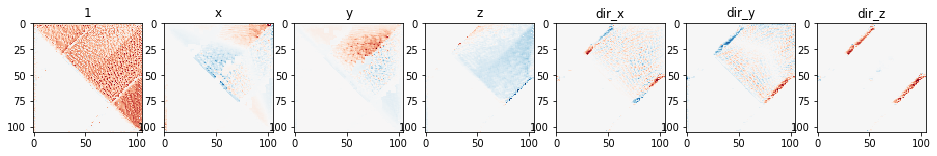

mGridZ


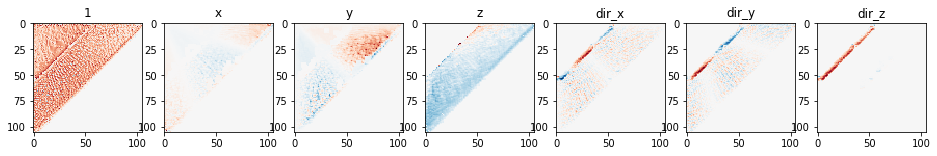

mGridDirX


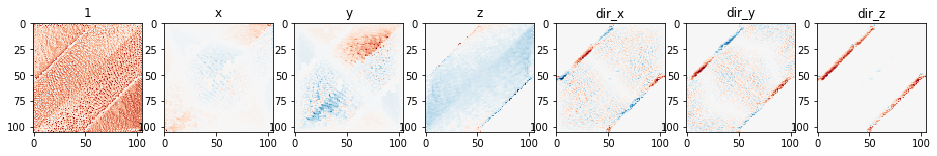

mGridDirY


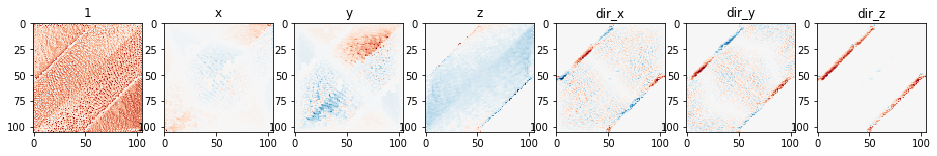

mGridDirZ


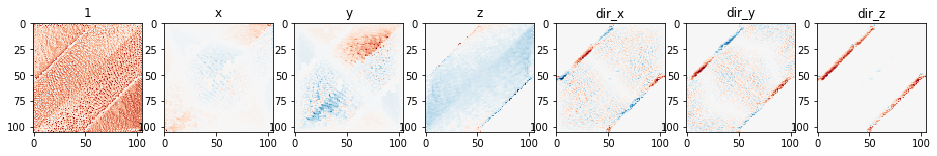

In [14]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:6,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    fig, (ax0,ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1, 7, figsize=(16,8),facecolor='w')
    imshowRdBu(ax0, tayloredInput[ev,0,:,:]); ax0.set_title('1')
    imshowRdBu(ax1, tayloredInput[ev,1,:,:]); ax1.set_title('x')
    imshowRdBu(ax2, tayloredInput[ev,2,:,:]); ax2.set_title('y')
    imshowRdBu(ax3, tayloredInput[ev,3,:,:]); ax3.set_title('z')
    imshowRdBu(ax4, tayloredInput[ev,4,:,:]); ax4.set_title('dir_x')
    imshowRdBu(ax5, tayloredInput[ev,5,:,:]); ax5.set_title('dir_y')
    imshowRdBu(ax6, tayloredInput[ev,6,:,:]); ax6.set_title('dir_z')
    plt.show()

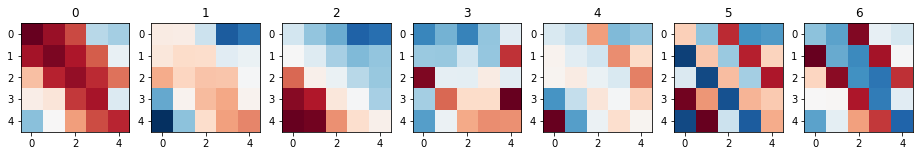

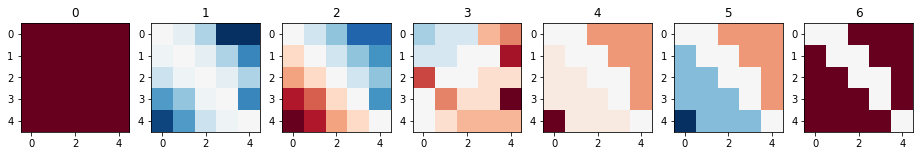

In [15]:
ih = 35
iw = 35

fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
for itaylor in range(Ntaylor):
    imshowRdBu(axes[itaylor], tGridAA[itaylor,ih,iw,].reshape((Nshift,Nshift))); axes[itaylor].set_title(itaylor)
plt.show()

fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
for itaylor in range(Ntaylor):
    imshowRdBu(axes[itaylor], torch.tensor(X[itaylor,ih,iw,].reshape((Nshift,Nshift)))); axes[itaylor].set_title(itaylor)
plt.show()

# for itaylor in range(Ntaylor):
#     print(itaylor, tGridAA[itaylor,ih,iw,].reshape((Nshift,Nshift)))

# for itaylor in range(Ntaylor):
#     print(itaylor, tGridAA[itaylor,ih,iw,].reshape((Nshift,Nshift)))

In [16]:
print(dis.reshape(Nshift,Nshift))
print(djs.reshape(Nshift,Nshift))

[[-2 -2 -2 -2 -2]
 [-1 -1 -1 -1 -1]
 [ 0  0  0  0  0]
 [ 1  1  1  1  1]
 [ 2  2  2  2  2]]
[[-2 -1  0  1  2]
 [-2 -1  0  1  2]
 [-2 -1  0  1  2]
 [-2 -1  0  1  2]
 [-2 -1  0  1  2]]


what if we increase the regularization strength?

In [17]:
# M: number of cols or rows grid

pad = 2

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()],
  f['mGridY'][()],
  f['mGridZ'][()],
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 100.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 25)
X.shape: (7, 105, 105, 25)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 25)


tGridAA.shape: torch.Size([7, 105, 105, 25])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 109, 109])
mGridX


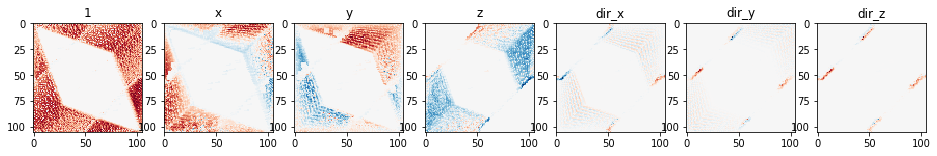

mGridY


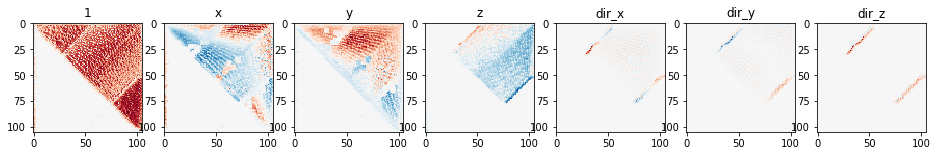

mGridZ


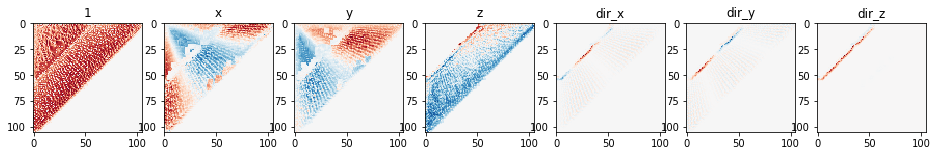

mGridDirX


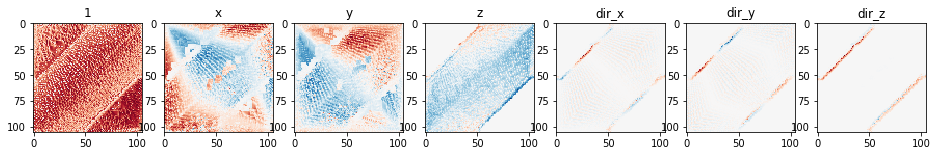

mGridDirY


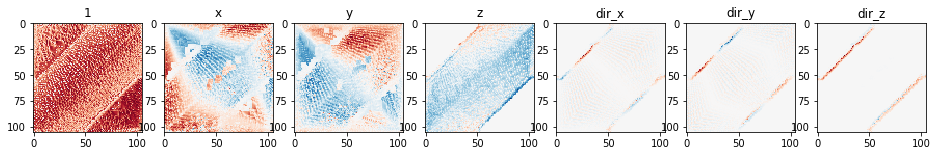

mGridDirZ


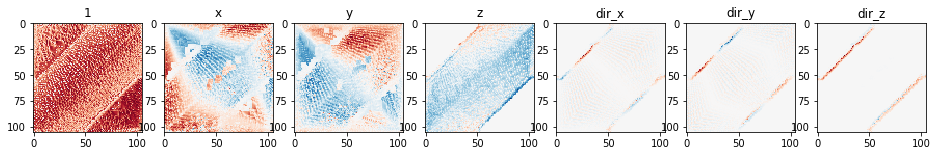

In [18]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:6,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    fig, (ax0,ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1, 7, figsize=(16,8),facecolor='w')
    imshowRdBu(ax0, tayloredInput[ev,0,:,:]); ax0.set_title('1')
    imshowRdBu(ax1, tayloredInput[ev,1,:,:]); ax1.set_title('x')
    imshowRdBu(ax2, tayloredInput[ev,2,:,:]); ax2.set_title('y')
    imshowRdBu(ax3, tayloredInput[ev,3,:,:]); ax3.set_title('z')
    imshowRdBu(ax4, tayloredInput[ev,4,:,:]); ax4.set_title('dir_x')
    imshowRdBu(ax5, tayloredInput[ev,5,:,:]); ax5.set_title('dir_y')
    imshowRdBu(ax6, tayloredInput[ev,6,:,:]); ax6.set_title('dir_z')
    plt.show()

## pad = 1

In [19]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()],
  f['mGridY'][()],
  f['mGridZ'][()],
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 100.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


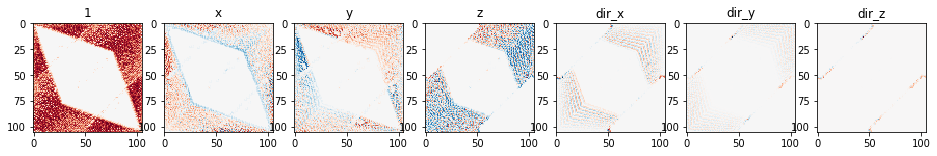

mGridY


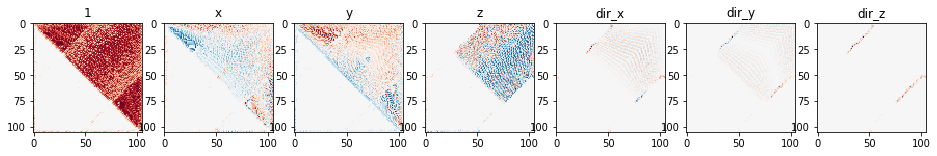

mGridZ


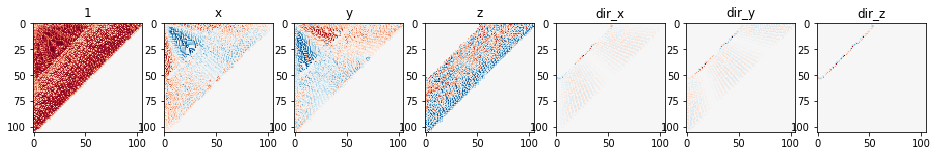

mGridDirX


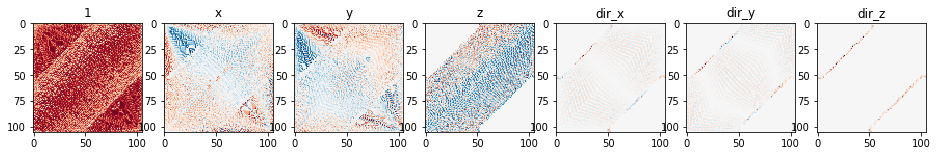

mGridDirY


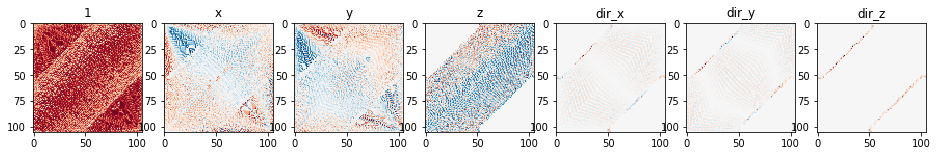

mGridDirZ


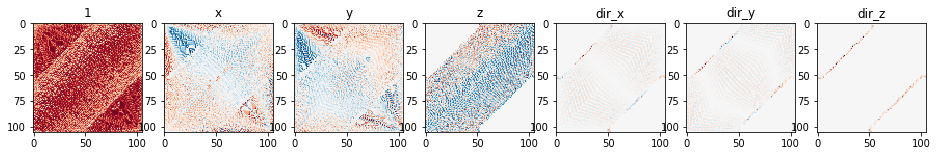

In [20]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:6,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    fig, (ax0,ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1, 7, figsize=(16,8),facecolor='w')
    imshowRdBu(ax0, tayloredInput[ev,0,:,:]); ax0.set_title('1')
    imshowRdBu(ax1, tayloredInput[ev,1,:,:]); ax1.set_title('x')
    imshowRdBu(ax2, tayloredInput[ev,2,:,:]); ax2.set_title('y')
    imshowRdBu(ax3, tayloredInput[ev,3,:,:]); ax3.set_title('z')
    imshowRdBu(ax4, tayloredInput[ev,4,:,:]); ax4.set_title('dir_x')
    imshowRdBu(ax5, tayloredInput[ev,5,:,:]); ax5.set_title('dir_y')
    imshowRdBu(ax6, tayloredInput[ev,6,:,:]); ax6.set_title('dir_z')
    plt.show()

## rescale xyz to get differences close to unity, then use Lambda=1

In [21]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 1.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


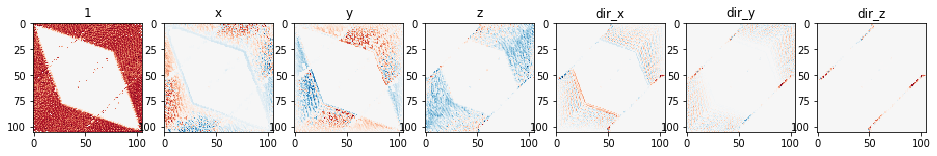

mGridY


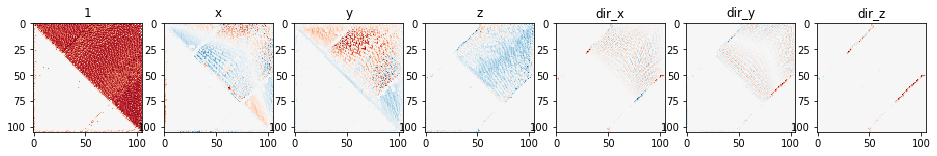

mGridZ


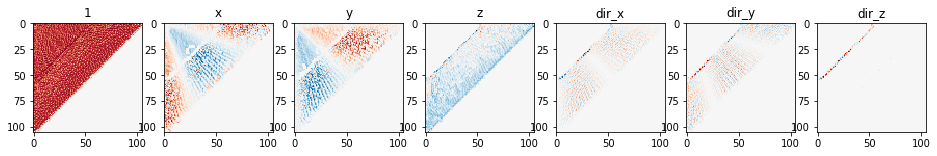

mGridDirX


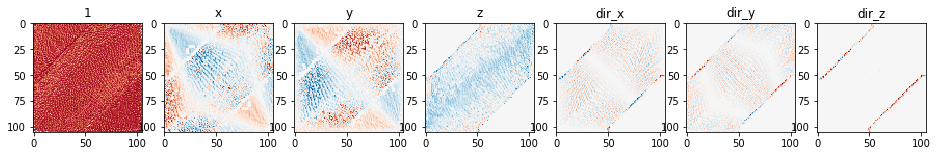

mGridDirY


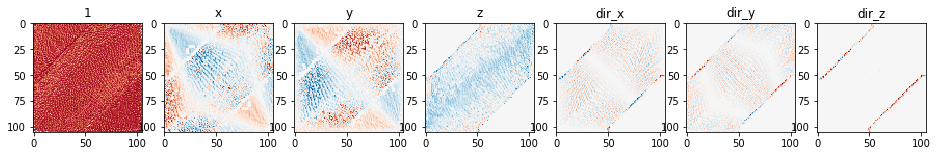

mGridDirZ


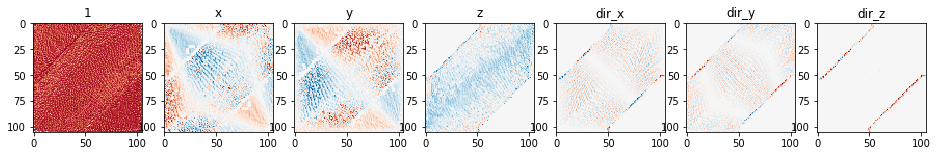

In [22]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:6,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    fig, (ax0,ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1, 7, figsize=(16,8),facecolor='w')
    imshowRdBu(ax0, tayloredInput[ev,0,:,:]); ax0.set_title('1')
    imshowRdBu(ax1, tayloredInput[ev,1,:,:]); ax1.set_title('x')
    imshowRdBu(ax2, tayloredInput[ev,2,:,:]); ax2.set_title('y')
    imshowRdBu(ax3, tayloredInput[ev,3,:,:]); ax3.set_title('z')
    imshowRdBu(ax4, tayloredInput[ev,4,:,:]); ax4.set_title('dir_x')
    imshowRdBu(ax5, tayloredInput[ev,5,:,:]); ax5.set_title('dir_y')
    imshowRdBu(ax6, tayloredInput[ev,6,:,:]); ax6.set_title('dir_z')
    plt.show()

## no direction coordinates

In [23]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 1.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (3, 105, 105, 9)
X.shape: (4, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (4, 105, 105, 9)


tGridAA.shape: torch.Size([4, 105, 105, 9])
tayloredInput.shape: torch.Size([3, 4, 1, 105, 105])
inputsPad.shape: torch.Size([3, 1, 107, 107])
mGridX


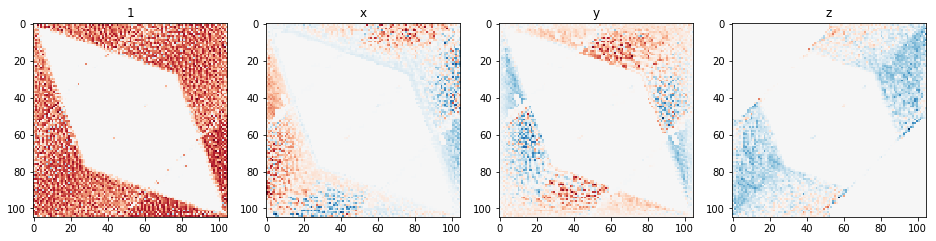

mGridY


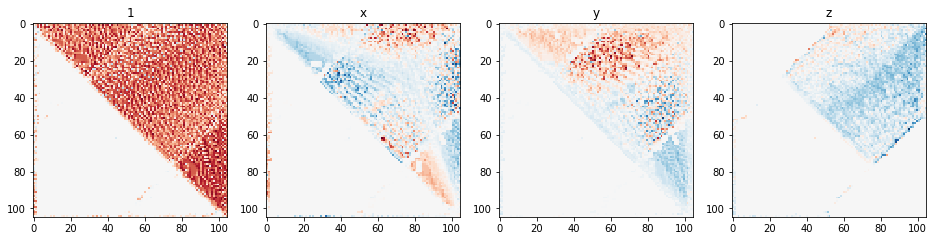

mGridZ


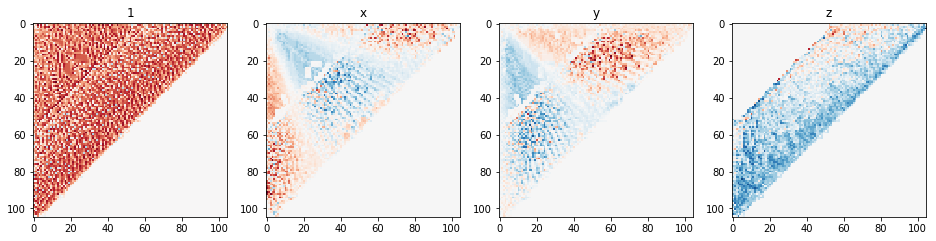

In [24]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## small regularizer

In [25]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 0.1; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


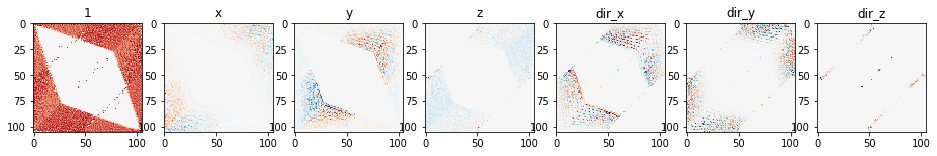

mGridY


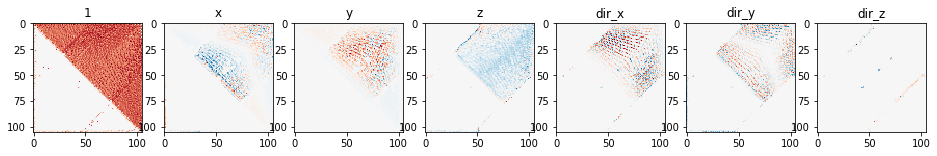

mGridZ


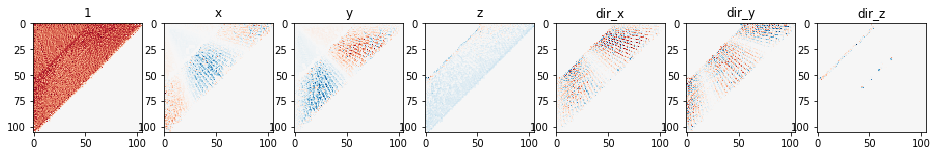

mGridDirX


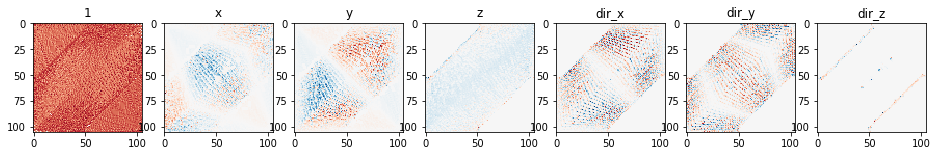

mGridDirY


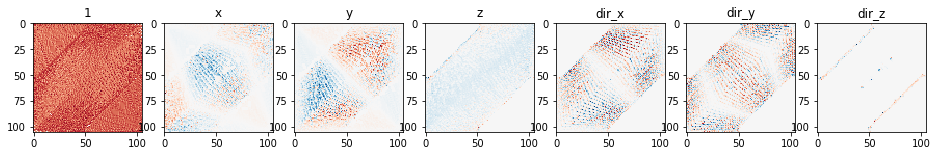

mGridDirZ


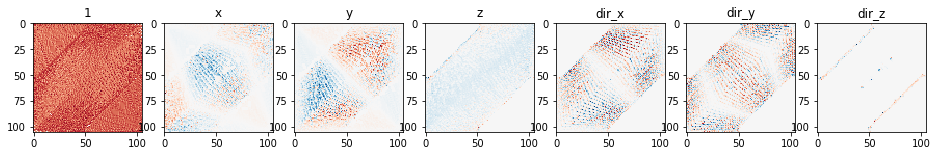

In [26]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## large regularizer

In [27]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 10.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


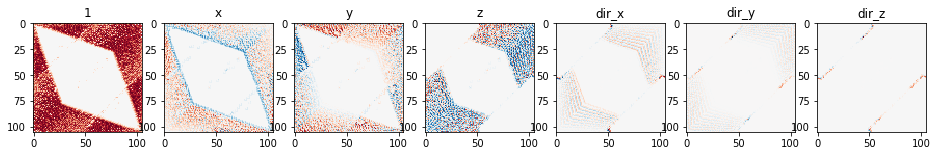

mGridY


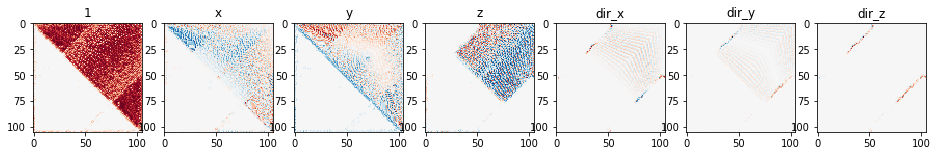

mGridZ


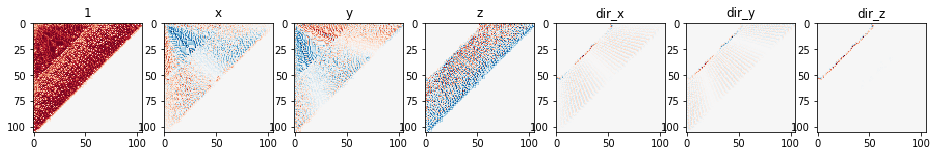

mGridDirX


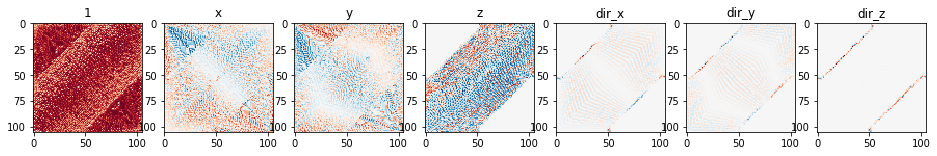

mGridDirY


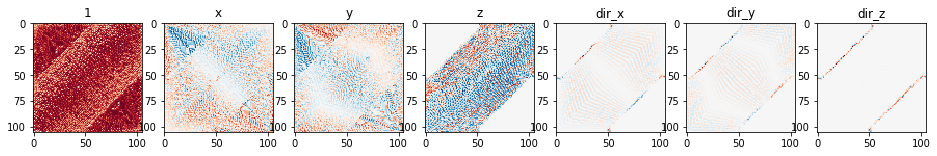

mGridDirZ


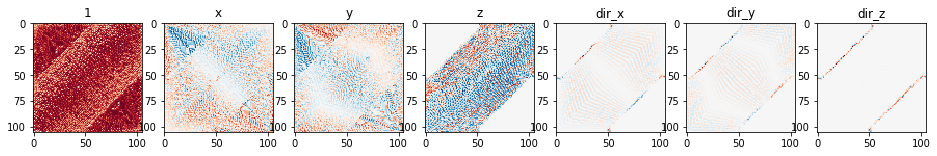

In [28]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## very large regularizer Lambda = 100.

In [29]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

# regularization strength
Lambda = 100.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(x[:,:,:,k]*x[:,:,:,j], axis=0), 1. + Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


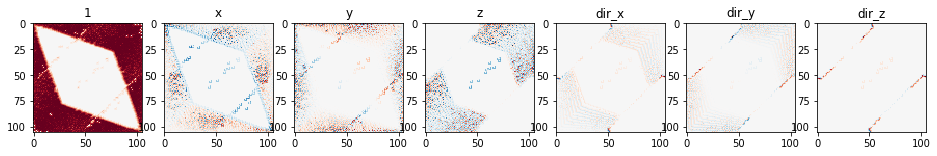

mGridY


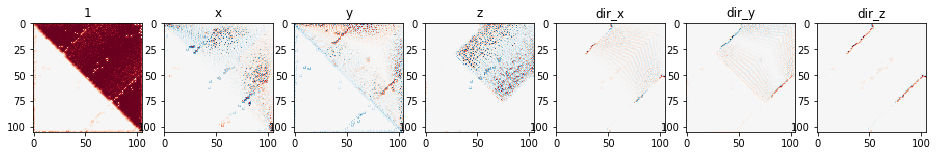

mGridZ


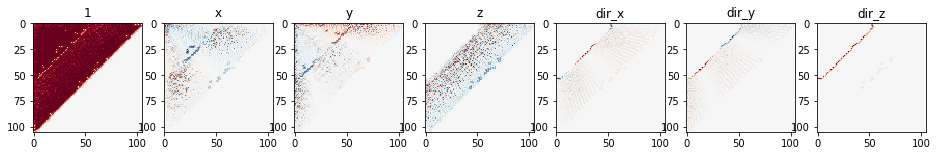

mGridDirX


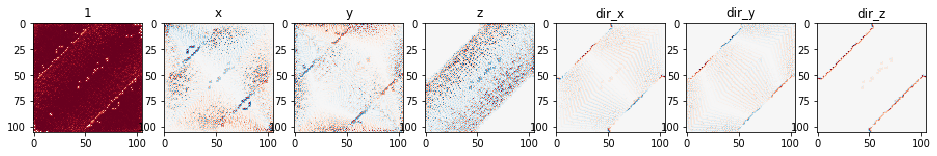

mGridDirY


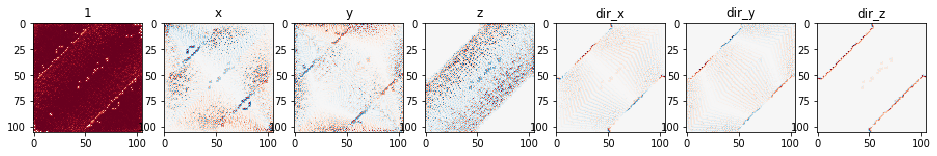

mGridDirZ


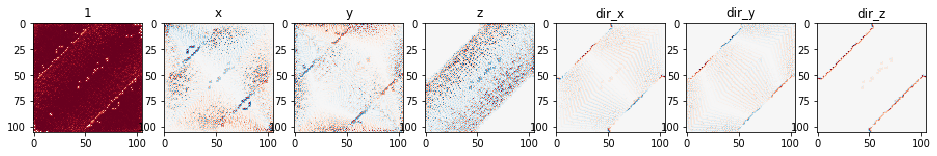

In [30]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## diagonal MA

(i.e. just use X instead of doing `AA = inv(MA)*X`)

In [31]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,1+Ncoords)) # 1+Ncoords needs to be extended if we include 2nd order deriv

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)    Ntaylor = 1 + Ncoords
X = np.concatenate([np.expand_dims(np.ones(x.shape[1:]),0),x])
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);
# if we also do second derivatives, X needs to be extended by a x*x term

AA = X
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


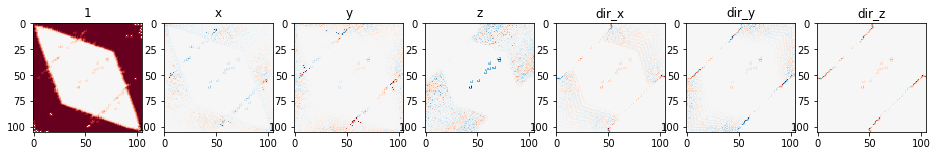

mGridY


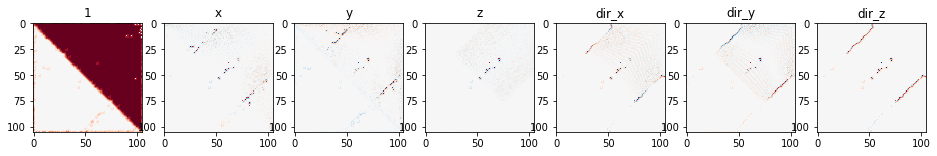

mGridZ


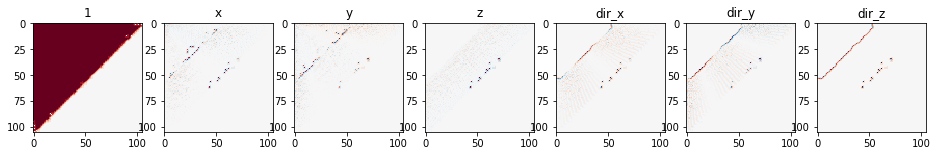

mGridDirX


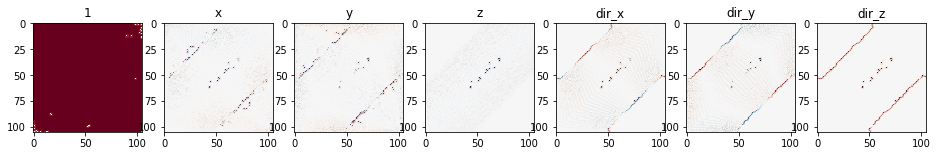

mGridDirY


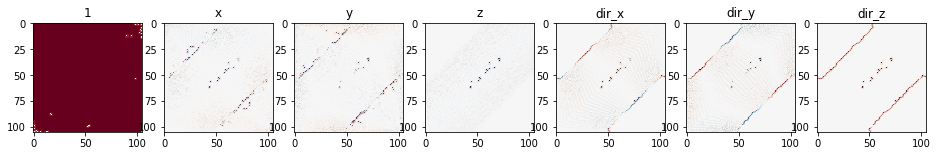

mGridDirZ


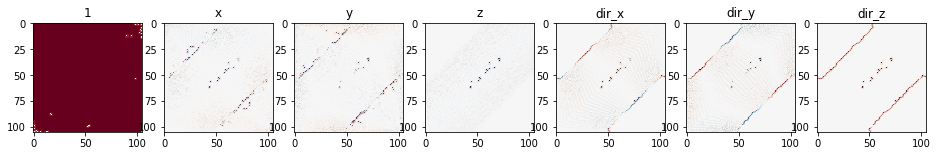

In [32]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
Ntaylor = 1 + Ncoords

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Ntaylor):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## do the second derivative as well

In [33]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords + (Ncoords*(Ncoords+1))//2

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,Ntaylor))

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)
Xlist = [np.expand_dims(np.ones(x.shape[1:]),0),x]
for i in range(Ncoords):
    Xlist.append(np.stack([x[i,:,:,:] for j in range(Ncoords-i)]) * x[i:,:,:,:])
X = np.concatenate(Xlist)
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);

# regularization strength
Lambda = 0.1; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(X[:,:,:,k]*X[:,:,:,j], axis=0), Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (28, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (28, 105, 105, 9)


tGridAA.shape: torch.Size([28, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 28, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


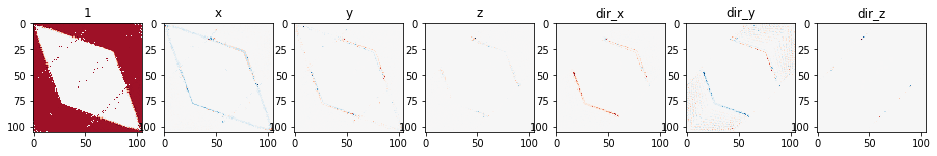

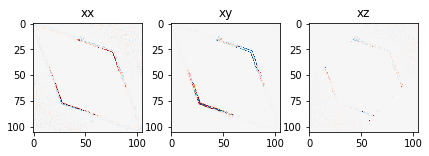

mGridY


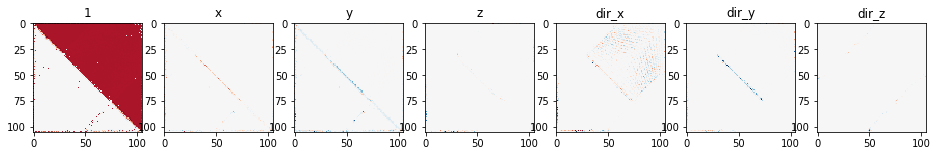

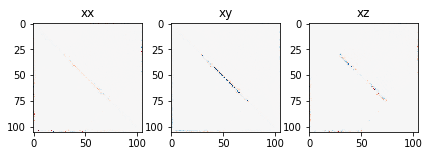

mGridZ


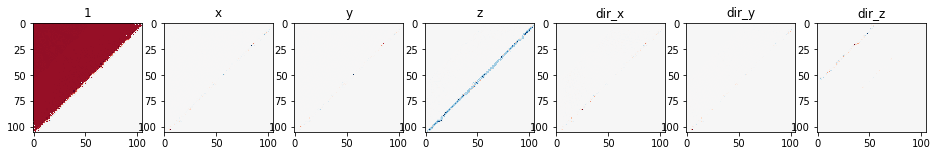

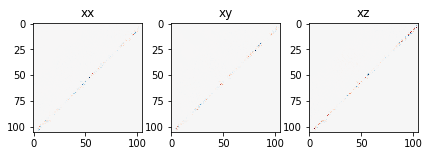

mGridDirX


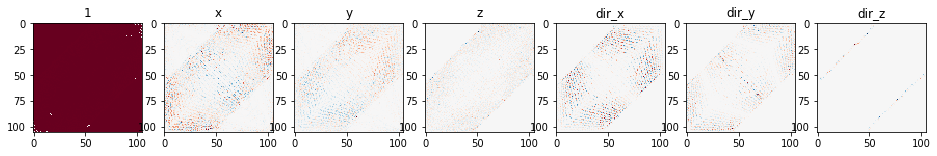

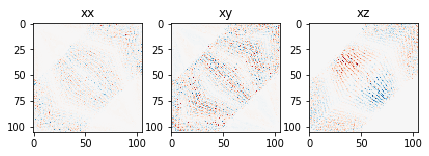

mGridDirY


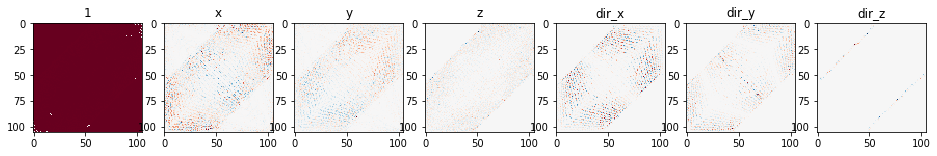

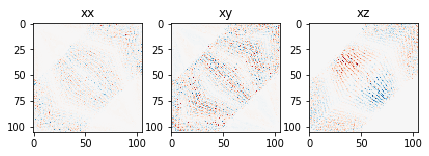

mGridDirZ


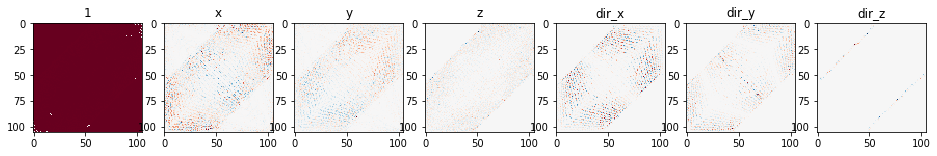

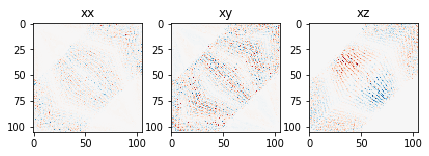

In [34]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]
tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Nsites):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, len(taylorTitles), figsize=(16,8),facecolor='w')
    for itaylor in range(len(taylorTitles)):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()
    
    taylorTitles = ['xx','xy','xz']
    fig, axes = plt.subplots(1, len(taylorTitles), figsize=(7,2),facecolor='w')
    for itaylor in range(len(taylorTitles)):
        imshowRdBu(axes[itaylor], tayloredInput[ev,7+itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## without second order but with summation bug corrected

the bug I found in previous iteration is that I was summing only over Ncoords and not over Nsites to make the taylored inputs

In [35]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords # + (Ncoords*(Ncoords+1))//2

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,Ntaylor))

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)
Xlist = [np.expand_dims(np.ones(x.shape[1:]),0),x]
#for i in range(Ncoords):
#    Xlist.append(np.stack([x[i,:,:,:] for j in range(Ncoords-i)]) * x[i:,:,:,:])
X = np.concatenate(Xlist)
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);

# regularization strength
Lambda = 0.1; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(X[:,:,:,k]*X[:,:,:,j], axis=0), Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


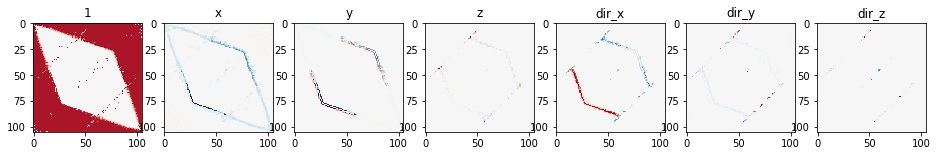

mGridY


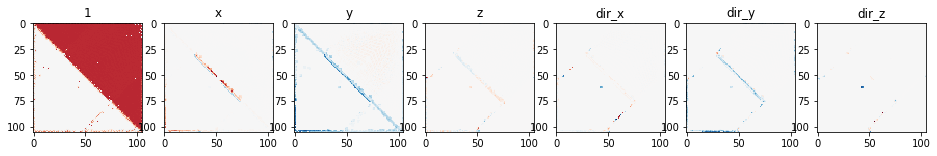

mGridZ


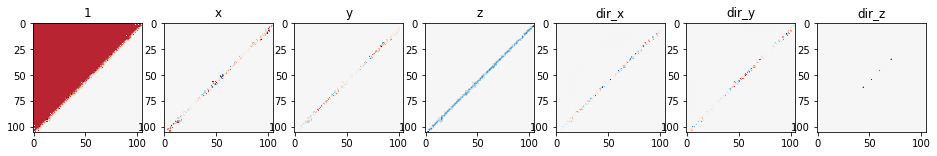

mGridDirX


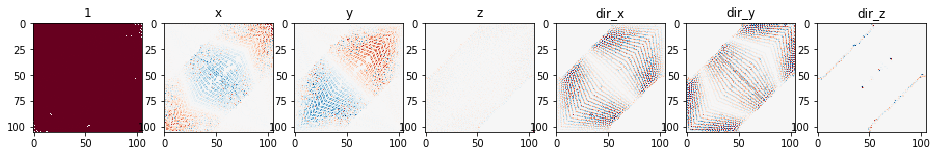

mGridDirY


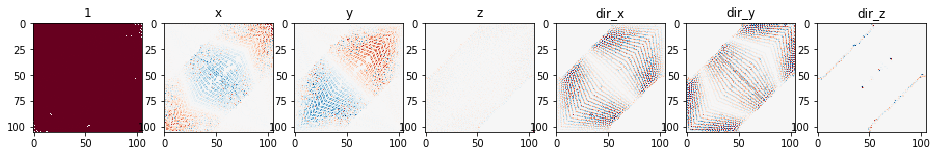

mGridDirZ


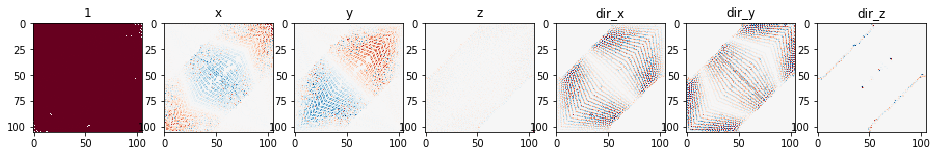

In [36]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 100)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Nsites):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


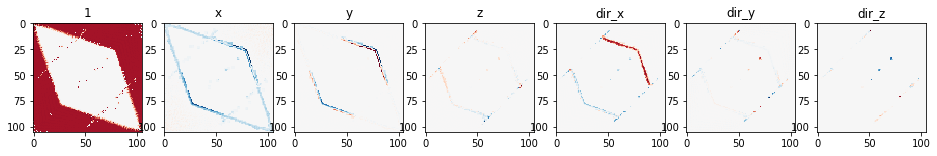

mGridY


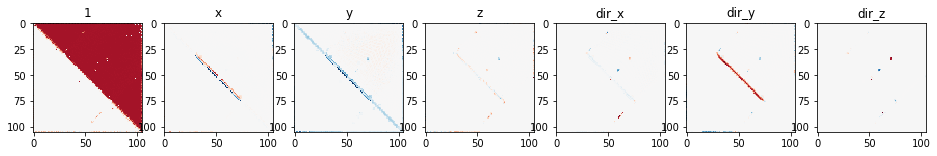

mGridZ


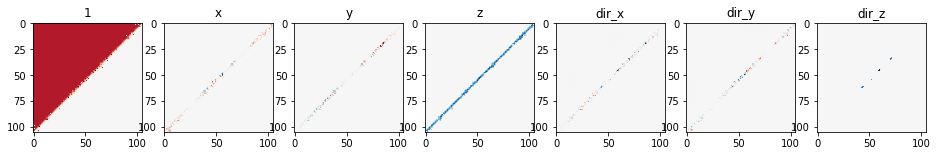

mGridDirX


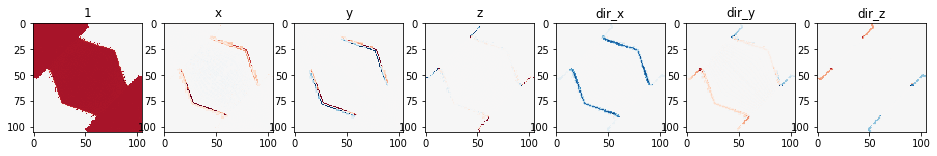

mGridDirY


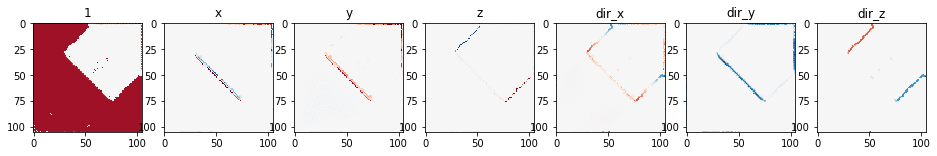

mGridDirZ


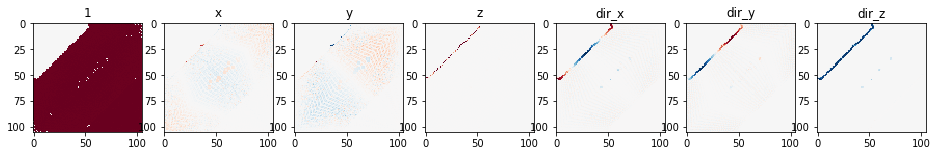

In [37]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 1e-3)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Nsites):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

with a normal event it looks like:

tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([8, 7, 1, 105, 105])
inputsPad.shape: torch.Size([8, 1, 107, 107])
0


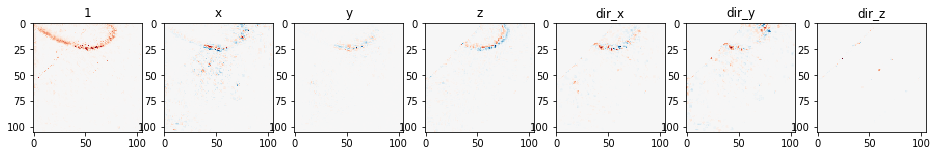

1


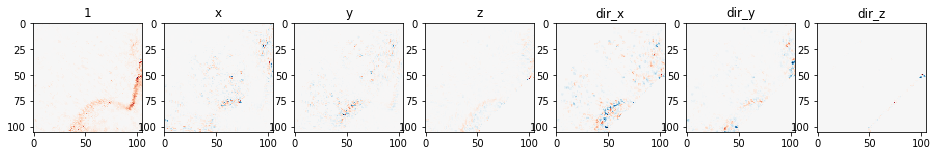

2


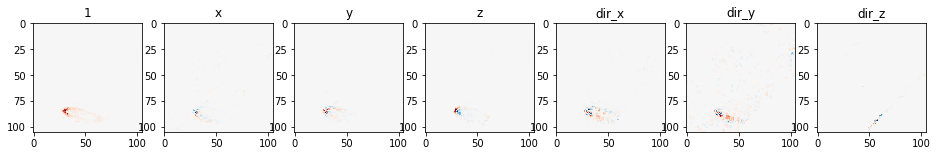

3


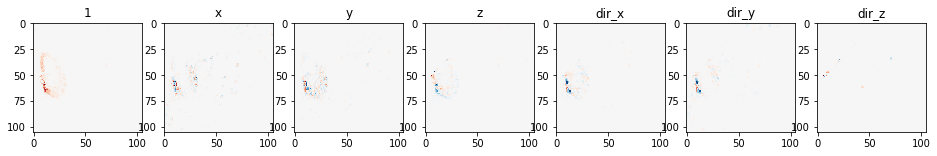

4


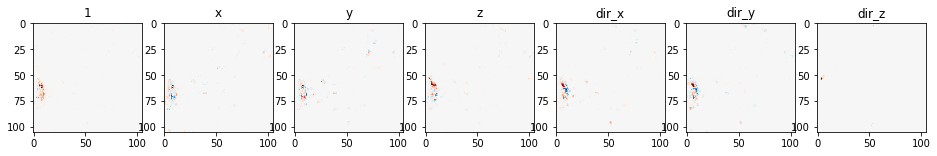

5


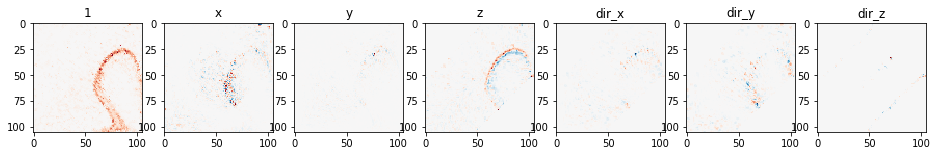

6


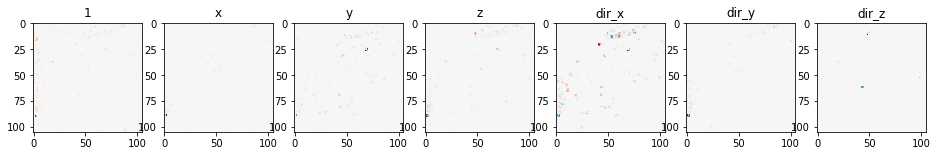

7


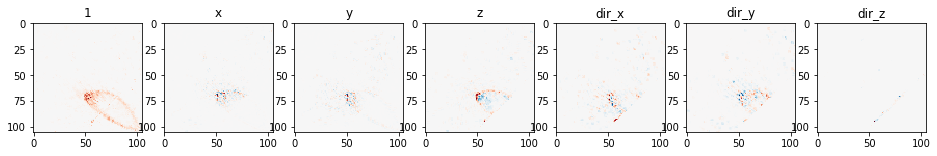

In [38]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:8,:,:,0]).unsqueeze(1);
# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Nsites):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)


for ev in range(tayloredInput.shape[0]):
    print(ev)
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## stronger regularizer

In [39]:
# M: number of cols or rows grid

pad = 1

mGridPmt = f['mGridPmt'][()]
mGridCoord = np.stack([
  f['mGridX'][()]/20.,
  f['mGridY'][()]/20.,
  f['mGridZ'][()]/20.,
  f['mGridDirX'][()],
  f['mGridDirY'][()],
  f['mGridDirZ'][()]
])
Ncoords = mGridCoord.shape[0]
Ntaylor = 1 + Ncoords # + (Ncoords*(Ncoords+1))//2

M = mGridPmt.shape[0]
mGridI = np.reshape(np.repeat(np.arange(M),M), (M,M))
mGridJ = mGridI.transpose()

Nshift = 2*pad+1
dij = np.reshape(np.repeat(np.arange(-pad,pad+1),Nshift), (Nshift,Nshift));
dis = dij.flatten()
djs = dij.transpose().flatten();
Nsites = dis.size;

mGridPmtpad = geometricPad(torch.tensor(mGridPmt).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridIpad = geometricPad(torch.tensor(mGridI).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();
mGridJpad = geometricPad(torch.tensor(mGridJ).unsqueeze(0).unsqueeze(0), pad).squeeze(0).squeeze(0).numpy();

mGridCoordPad = geometricPad(torch.tensor(mGridCoord).unsqueeze(0), pad).squeeze(0).numpy();


mGridAA2 = np.zeros((M,M,Nshift,Nshift,Ntaylor))

pmtI1 = mGridPmt[:,:]; # index in tank.pmt

x      = np.zeros((Ncoords,M,M,Nsites));     # coordinates for each direction
skip   = np.zeros((M,M,Nsites), dtype=bool); # for each direction whether we should skip or not
processedPmtI2s = np.zeros((M,M,Nsites), dtype=int) - 1;

for diji in range(Nsites):
    di = dis[diji]
    dj = djs[diji]
    # i2 = mGridIpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    # j2 = mGridJpad[pad+di:pad+M+di,pad+dj:pad+M+dj];
    pmtI2 = mGridPmtpad[(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)];
    processedPmtI2s[:,:,diji] = pmtI2;
    
    skip[:,:,diji] = np.logical_or(np.equal(pmtI1,-1), np.equal(pmtI2,-1));
    for prev_diji in range(diji):
        skip[:,:,diji] = np.logical_or(skip[:,:,diji], np.equal(processedPmtI2s[:,:,prev_diji],pmtI2));
    
    x[:,:,:,diji] = mGridCoordPad[:,(pad+di):(pad+M+di),(pad+dj):(pad+M+dj)] - mGridCoord; # 

# x: (Ncoords,M,M,Nsites)
print('x.shape:', x.shape)
# X: (Ntaylor,M,M,Nsites)
Xlist = [np.expand_dims(np.ones(x.shape[1:]),0),x]
#for i in range(Ncoords):
#    Xlist.append(np.stack([x[i,:,:,:] for j in range(Ncoords-i)]) * x[i:,:,:,:])
X = np.concatenate(Xlist)
print('X.shape:', X.shape)
X = np.where(np.expand_dims(skip, 0), 0., X);

# regularization strength
Lambda = 1.; # this should be somewhat smaller than typical values of x

MA = np.zeros((M,M,Nsites,Nsites));
for k in range(Nsites):
    for j in range(Nsites):
        MA[:,:,k,j] = np.add(np.sum(X[:,:,:,k]*X[:,:,:,j], axis=0), Lambda**2 * (k==j));
    # clear skip entries
    MA[:,:,k,:] = np.where(np.expand_dims(skip[:,:,k],-1), 0., MA[:,:,k,:]);
    MA[:,:,:,j] = np.where(np.expand_dims(skip[:,:,j],-1), 0., MA[:,:,:,j]);
    # set diagonal:
    MA[:,:,k,k] = np.where(skip[:,:,k], 1., MA[:,:,k,k]);

#print('MA.shape:',MA.shape)
#print(MA[0,1,:,:])
#print(np.linalg.inv(MA[0,1,:,:]))
print("starting inversion... (may take a few seconds)")
AA = np.einsum('hwsi,thwi->thws', np.linalg.inv(MA), X)
print("done")
print('AA.shape:', AA.shape)

x.shape: (6, 105, 105, 9)
X.shape: (7, 105, 105, 9)
starting inversion... (may take a few seconds)
done
AA.shape: (7, 105, 105, 9)


tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([6, 7, 1, 105, 105])
inputsPad.shape: torch.Size([6, 1, 107, 107])
mGridX


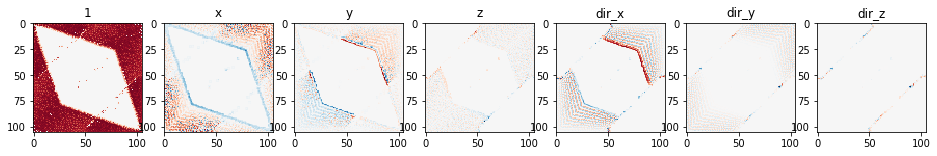

mGridY


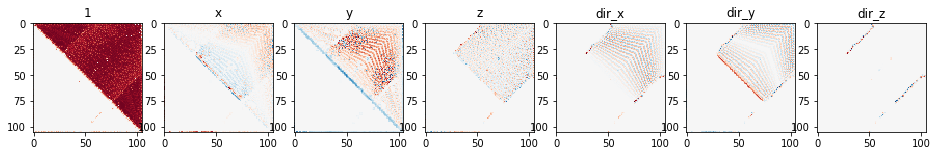

mGridZ


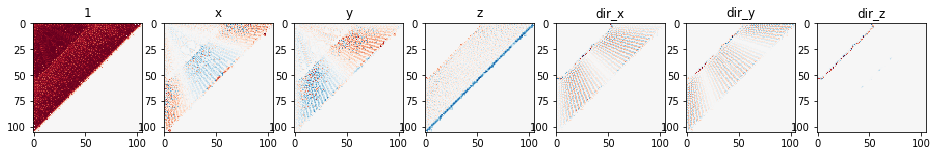

mGridDirX


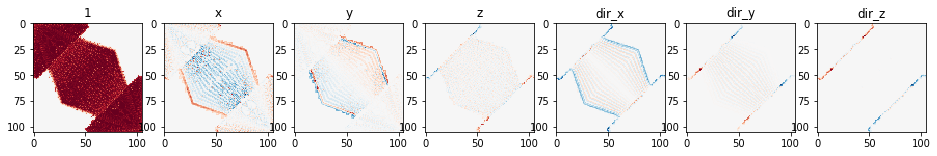

mGridDirY


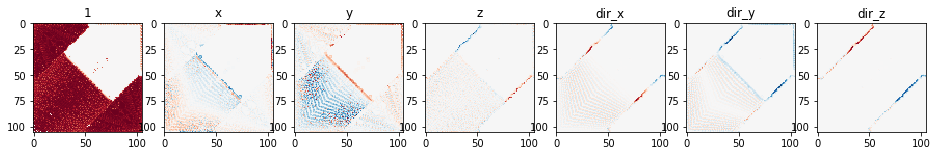

mGridDirZ


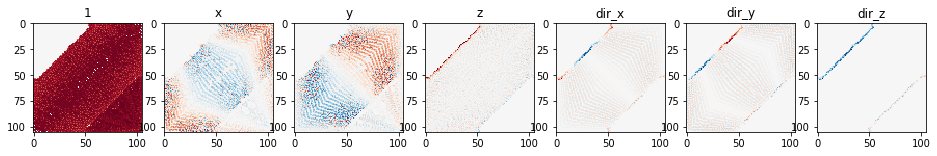

In [40]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:Ncoords,:,:,0]).unsqueeze(1);
evMeanings = ['X','Y','Z','DirX','DirY','DirZ']
for ev in range(inputs.shape[0]):
    inputs[ev,0,:,:] = (torch.tensor(f['mGrid%s' % evMeanings[ev]][()]) < 1e-3)

# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Nsites):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)

for ev in range(inputs.shape[0]):
    print('mGrid%s' % evMeanings[ev])
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([8, 7, 1, 105, 105])
inputsPad.shape: torch.Size([8, 1, 107, 107])
0


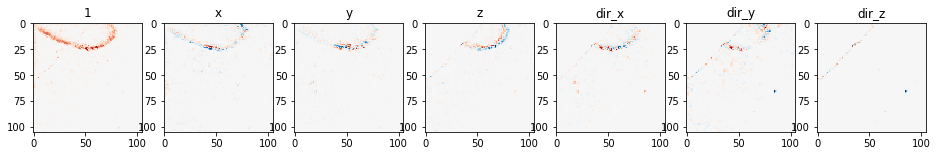

1


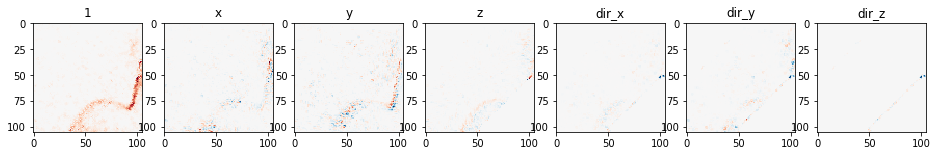

2


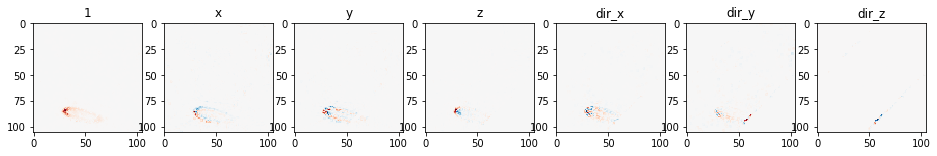

3


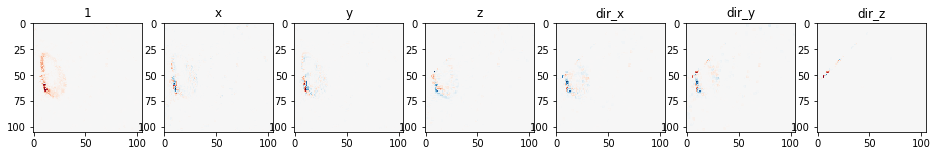

4


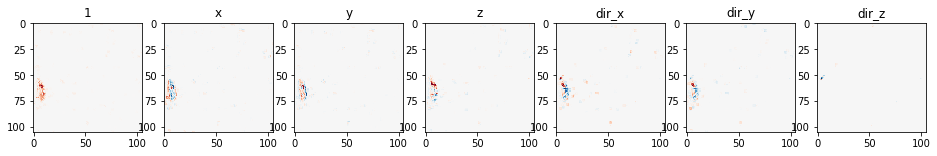

5


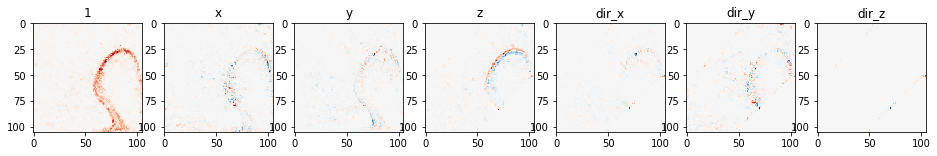

6


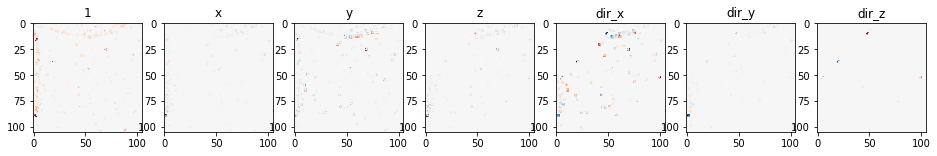

7


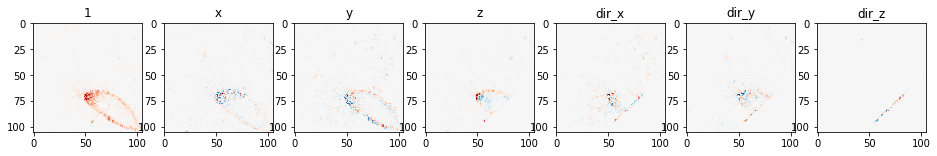

In [41]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:8,:,:,0]).unsqueeze(1);
# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Nsites):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # fill
    out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    tayloredInput = out

tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)


for ev in range(tayloredInput.shape[0]):
    print(ev)
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()

## Tayloring without einsum

Einsum allocates a new tensor, and since we add this in a loop this can cause issues with garbage collection. So let's try to use in-place addition instead.

tGridAA.shape: torch.Size([7, 105, 105, 9])
tayloredInput.shape: torch.Size([8, 7, 1, 105, 105])
inputsPad.shape: torch.Size([8, 1, 107, 107])
0


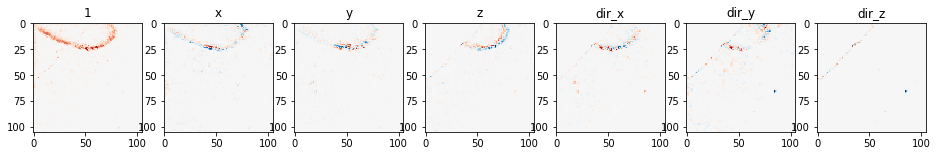

1


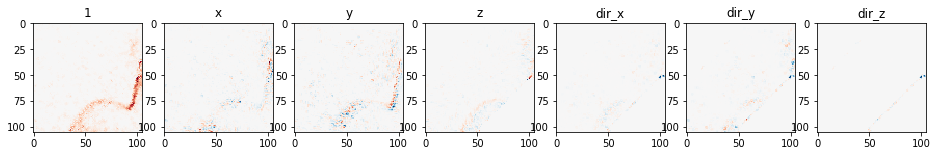

2


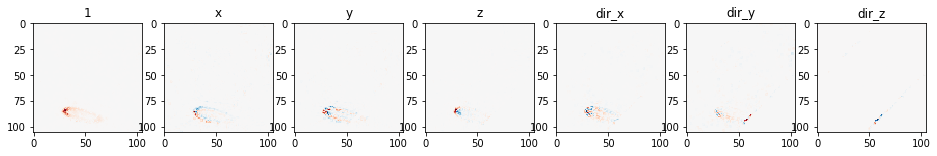

3


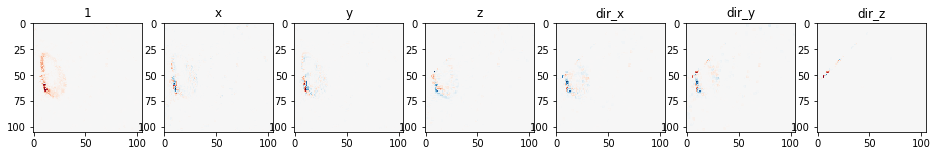

4


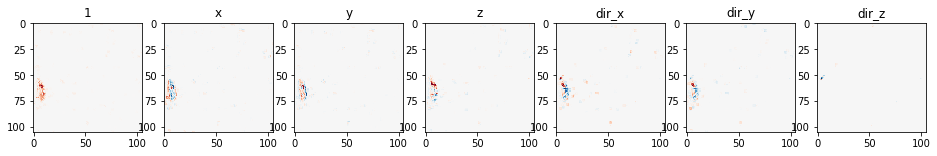

5


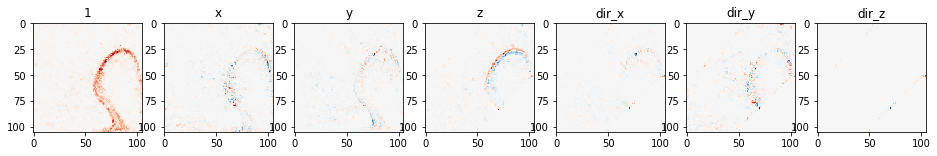

6


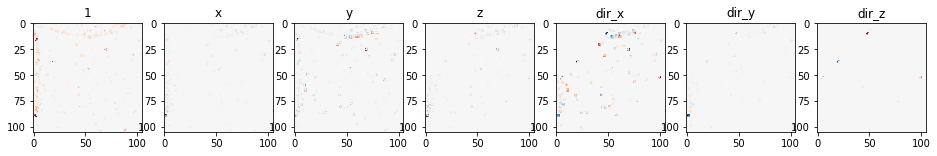

7


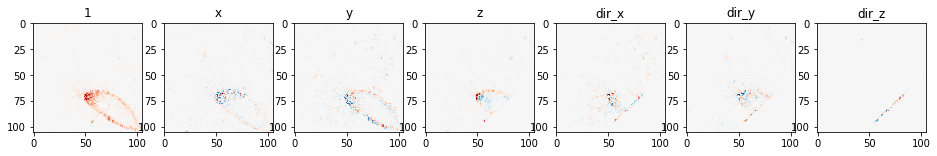

In [42]:
mGridAA = AA

Cin = 1; # Q
Hin = event_data.shape[1];
Win = event_data.shape[2];

# Cout = 4;
# Hflt = 2*pad+1;
# Wflt = 2*pad+1;

# filters = torch.randn(Cout,Cin,Hflt,Wflt);
inputs = torch.tensor(event_data[0:8,:,:,0]).unsqueeze(1);
# outputs = torch.nn.functional.conv2d(geometricPad(inputs, pad), filters);

# print('filters.shape = ', filters.shape, 'should be (',Cout,',',Cin,',',Hflt,',',Wflt,')');
# print('inputs .shape = ', inputs.shape, 'should be (5,',Cin,',',Hin,',',Win,')');
# print('outputs.shape = ', outputs.shape, 'should be (5,',Cout,',',Hin,',',Win,')');

inputsPad = geometricPad(inputs, pad); # (B,C,W,H)

Nbatch = inputs.shape[0]

tGridAA = torch.tensor(mGridAA, dtype=torch.float)

tayloredInput = torch.zeros((Nbatch,Ntaylor,Cin,Hin,Win))
print('tGridAA.shape:', tGridAA.shape)
print('tayloredInput.shape:', tayloredInput.shape)
print('inputsPad.shape:', inputsPad.shape)
for k in range(Nsites):
    # shift grid according to position (without copying the data)
    inputsPadD1 = torch.narrow(inputsPad,   2, pad+int(dis[k]), M)
    inputsPadD2 = torch.narrow(inputsPadD1, 3, pad+int(djs[k]), M)
    # at this point we have
    # tGridAA[:,:,:,k] = (d,i,j)   = (taylor,height,width)
    # inputsPadD2      = (b,c,i,j) = (batch,channel,height,width)
    # 
    # what we want to do is an in-place operation equivalent to
    # out = torch.add(tayloredInput, torch.einsum('dij,bcij->bdcij', tGridAA[:,:,:,k], inputsPadD2))
    # tayloredInput = out
    
    tGridAAk = tGridAA[:,:,:,k].unsqueeze(0).unsqueeze(2)
    inputsPadD2 = inputsPadD2.unsqueeze(1)
    # now we have
    # tGridAAk    = ( ,d, ,i,j)
    # inputsPadD2 = (b, ,c,i,j)
    # so we can realize torch.einsum('dij,bcij->bdcij') with broadcasting
    
    # perform in-place addition
    tayloredInput.addcmul_(1., tGridAAk, inputsPadD2)

# contract the taylor*channel dimension
tayloredInput = tayloredInput.view(Nbatch, Ntaylor*Cin, Hin, Win)


def imshowRdBu(ax,img):
    minmax = max(torch.max(img),-torch.min(img))
    ax.imshow(-img,cmap='RdBu',vmin=-minmax,vmax=minmax)


for ev in range(tayloredInput.shape[0]):
    print(ev)
    taylorTitles = ['1','x','y','z','dir_x','dir_y','dir_z']
    fig, axes = plt.subplots(1, Ntaylor, figsize=(16,8),facecolor='w')
    for itaylor in range(Ntaylor):
        imshowRdBu(axes[itaylor], tayloredInput[ev,itaylor,:,:]); axes[itaylor].set_title(taylorTitles[itaylor])
    plt.show()